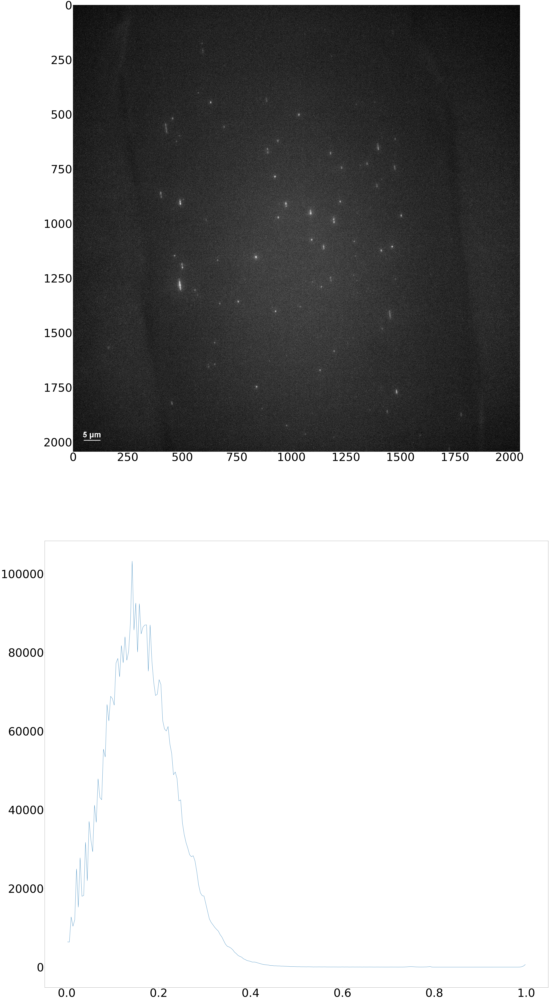

In [7]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

from skimage import data
from skimage.exposure import histogram
from skimage.color import rgb2gray
from skimage import morphology

image = Image.open('Examples/Device2_Area2_During30kcaseinandADAMTS13flow.jpg')
img_array = np.array(image)
image_gray = rgb2gray(img_array)
hist, hist_centers = histogram(image_gray)

plt.rcParams.update({'font.size': 100})
fig, axes = plt.subplots(2, 1, figsize=(80, 160))
axes[0].imshow(image_gray, cmap=plt.cm.gray)
#axes[0].axis('off')
axes[1].plot(hist_centers, hist, lw=2)

In [4]:
from skimage.filters import sobel
from skimage.color import label2rgb
from scipy import ndimage
import collections

elevation_map = sobel(image_gray)

markers = np.zeros_like(image_gray)
markers[image_gray < .4] = 1                                   #set the threshold as 0.5 in grayscale
markers[image_gray > .4] = 2

segmentation = morphology.watershed(elevation_map, markers)
segmentation = ndimage.binary_fill_holes(segmentation - 1)
labeled_image_gray, _ = ndimage.label(segmentation)

a = collections.Counter(labeled_image_gray.reshape(-1))
b=collections.Counter(el for el in a.elements() if a[el] >=5)   #set the threshold as 5 pixels

sorted_val=[]
for key,val in b.items():
    sorted_val.append(key)
sorted_val=sorted_val[1:]                                       #get rid of sorted_val[0]=0
print(sorted_val)

[572, 697, 744, 824, 860, 877, 924, 927, 1042, 1120, 1153, 1178, 1258, 1260, 1446, 1494, 1518, 1732, 2025, 2192, 2214, 2374, 2486, 2510, 2577, 2623, 3047, 3327, 3377, 3451, 3543, 4788, 4853, 5026, 5300, 5367, 5614, 5979, 6076, 6097, 6132, 6140, 6197, 6269, 6476, 6740, 6972, 7742, 7893, 7950, 8099, 8163, 8402, 8652, 9419, 9590, 9792, 10071, 10107, 10254, 10982, 11518, 11789, 12142, 12199, 12277, 12596, 12673, 12851, 12959, 13091, 13154, 13165, 13166, 13221]


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


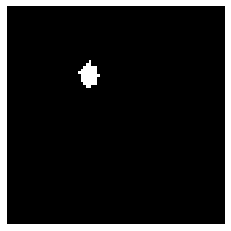

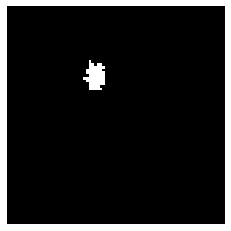

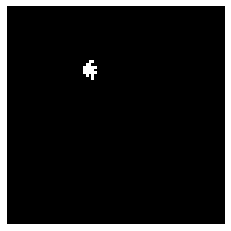

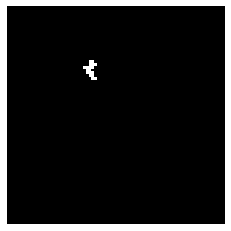

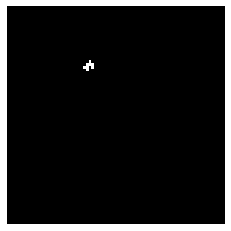

...

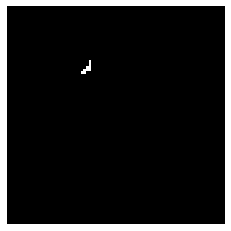

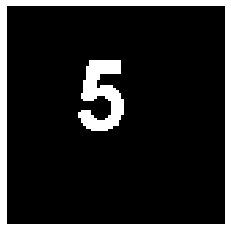

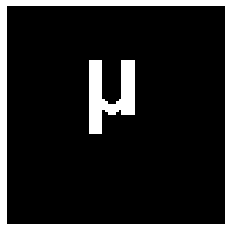

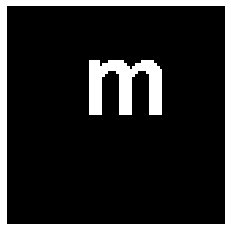

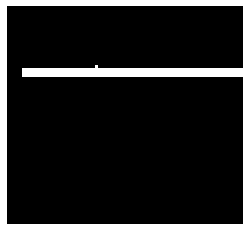

In [11]:
for i in sorted_val:
    seg_map = np.copy(labeled_image_gray)
    x,y=np.where(labeled_image_gray == i)
#    print(x[0],y[0])
    seg_map[labeled_image_gray != i] = 0
    cropped = seg_map[x[0]-20:x[0]+60,y[0]-30:y[0]+50]
    plt.figure()
    plt.axis('off')
    plt.imshow(cropped, cmap=plt.cm.gray)

1990 74


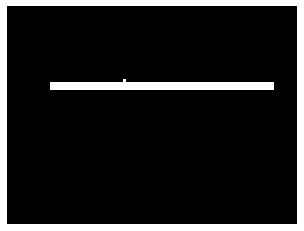

In [43]:
seg_map = np.copy(labeled_image_gray)
x,y=np.where(labeled_image_gray == sorted_val[54])
print(x[0],y[0])
seg_map[labeled_image_gray != sorted_val[54]] = 0
cropped = seg_map[x[0]-25:x[0]+50,y[0]-40:y[0]+60]
plt.figure()
plt.axis('off')
plt.imshow(cropped, cmap=plt.cm.gray)

In [38]:
len(sorted_val)

55